In [1]:
import pandas as pd
import numpy as np
import scipy
import sklearn
import altair as alt
import matplotlib.pyplot as plt 
import seaborn as sns

# Exploring Data

In [2]:
df_loan_test = pd.read_csv('loan_test.csv')
df_loan_train = pd.read_csv('loan_train.csv')

In [3]:
df_loan_train.describe()

,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History
count,614.000000,614.000000,592.000000,600.00000,564.000000
mean,5403.459283,1621.245798,146.412162,342.00000,0.842199
std,6109.041673,2926.248369,85.587325,65.12041,0.364878
min,150.000000,0.000000,9.000000,12.00000,0.000000
25%,2877.500000,0.000000,100.000000,360.00000,1.000000
50%,3812.500000,1188.500000,128.000000,360.00000,1.000000
75%,5795.000000,2297.250000,168.000000,360.00000,1.000000
max,81000.000000,41667.000000,700.000000,480.00000,1.000000


In [4]:
df_loan_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 614 entries, 0 to 613
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Loan_ID            614 non-null    object 
 1   Gender             601 non-null    object 
 2   Married            611 non-null    object 
 3   Dependents         599 non-null    object 
 4   Education          614 non-null    object 
 5   Self_Employed      582 non-null    object 
 6   ApplicantIncome    614 non-null    int64  
 7   CoapplicantIncome  614 non-null    float64
 8   LoanAmount         592 non-null    float64
 9   Loan_Amount_Term   600 non-null    float64
 10  Credit_History     564 non-null    float64
 11  Property_Area      614 non-null    object 
 12  Loan_Status        614 non-null    object 
dtypes: float64(4), int64(1), object(8)
memory usage: 62.5+ KB


In [5]:
df_loan_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 367 entries, 0 to 366
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Loan_ID            367 non-null    object 
 1   Gender             356 non-null    object 
 2   Married            367 non-null    object 
 3   Dependents         357 non-null    object 
 4   Education          367 non-null    object 
 5   Self_Employed      344 non-null    object 
 6   ApplicantIncome    367 non-null    int64  
 7   CoapplicantIncome  367 non-null    int64  
 8   LoanAmount         362 non-null    float64
 9   Loan_Amount_Term   361 non-null    float64
 10  Credit_History     338 non-null    float64
 11  Property_Area      367 non-null    object 
dtypes: float64(3), int64(2), object(7)
memory usage: 34.5+ KB


# Cleaning Data

<AxesSubplot:>

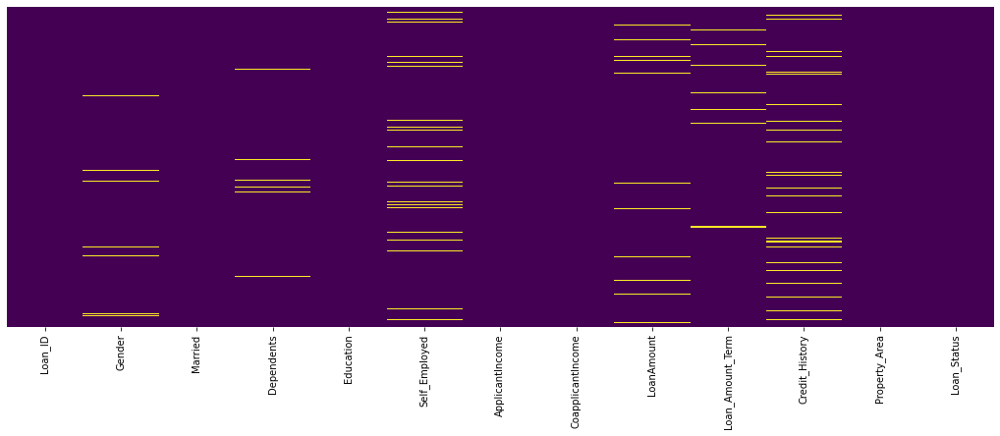

In [6]:
plt.figure(figsize=(18,6))
sns.heatmap(data = df_loan_train.isnull(), yticklabels=False, cbar=False, cmap='viridis')

In [7]:
#noticing that credit history has most nulls
df_loan_train['Credit_History'].isna().value_counts()

False    564
True      50
Name: Credit_History, dtype: int64

In [8]:
#making the assumption that Not applicable means that the credit history does not exist. We cant make decisions based on their credit history if it does not does not exist and dropping 50 rows would be too much data loss.
df_loan_train['Credit_History']=df_loan_train['Credit_History'].fillna(0)
df_loan_test['Credit_History']=df_loan_test['Credit_History'].fillna(0)

<AxesSubplot:>

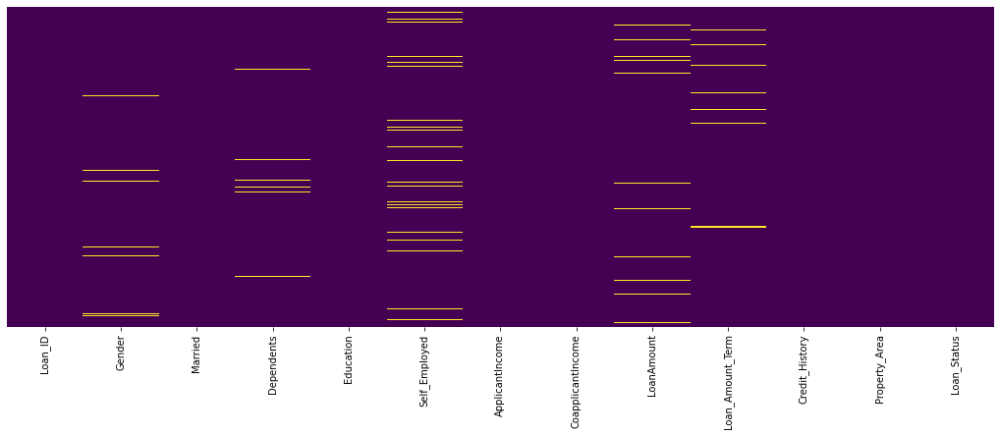

In [9]:
#updated heatmap of nulls
plt.figure(figsize=(18,6))
sns.heatmap(data = df_loan_train.isnull(), yticklabels=False, cbar=False, cmap='viridis')

In [10]:
#next column that seems to have a lot of null values is self employed. lets explore this data
df_loan_train['Self_Employed'].isna().value_counts()

False    582
True      32
Name: Self_Employed, dtype: int64

In [11]:
#not covering 
df_loan_train['Self_Employed'].value_counts()

No     500
Yes     82
Name: Self_Employed, dtype: int64

In [12]:
#self employed is another field that has a true/false value. There isnt much coverage for the values of unemployed vs employed, so we dont necessarilly know about that. I would ideally like better data to work with, but in this case since there is only 2 values, we'll replace the NA's with No. No in this case covers ALL of the conditions that are not Yes.

df_loan_train['Self_Employed'] = df_loan_train['Self_Employed'].fillna('No')
df_loan_test['Self_Employed'] = df_loan_test['Self_Employed'].fillna('No')

<AxesSubplot:>

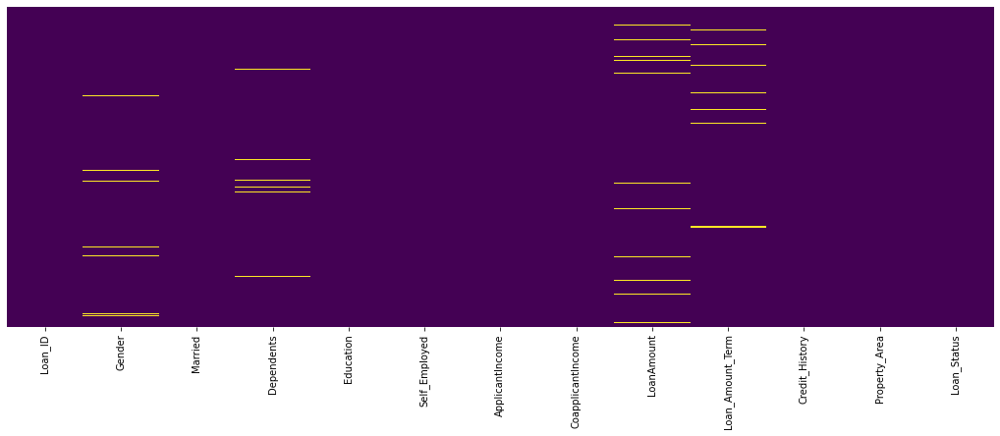

In [13]:
#updated heatmap of nulls
plt.figure(figsize=(18,6))
sns.heatmap(data = df_loan_train.isnull(), yticklabels=False, cbar=False, cmap='viridis')

In [14]:
print(df_loan_train['LoanAmount'].value_counts())
print('\n\n',df_loan_train['LoanAmount'].isna().value_counts())

120.0    20
110.0    17
100.0    15
160.0    12
187.0    12
         ..
211.0     1
250.0     1
62.0      1
85.0      1
436.0     1
Name: LoanAmount, Length: 203, dtype: int64


 False    592
True      22
Name: LoanAmount, dtype: int64


In [15]:
#pretty wide variety of value counts for loan data, 22 nulls. Going to convert to mean to minimize affect on data's distribution without dropping valuable data from other columns
loan_amt_train_mean = df_loan_train['LoanAmount'].mean()
loan_amt_test_mean = df_loan_test['LoanAmount'].mean()

df_loan_train['LoanAmount'] = df_loan_train['LoanAmount'].fillna(loan_amt_train_mean)
df_loan_test['LoanAmount'] = df_loan_test['LoanAmount'].fillna(loan_amt_test_mean)

<AxesSubplot:>

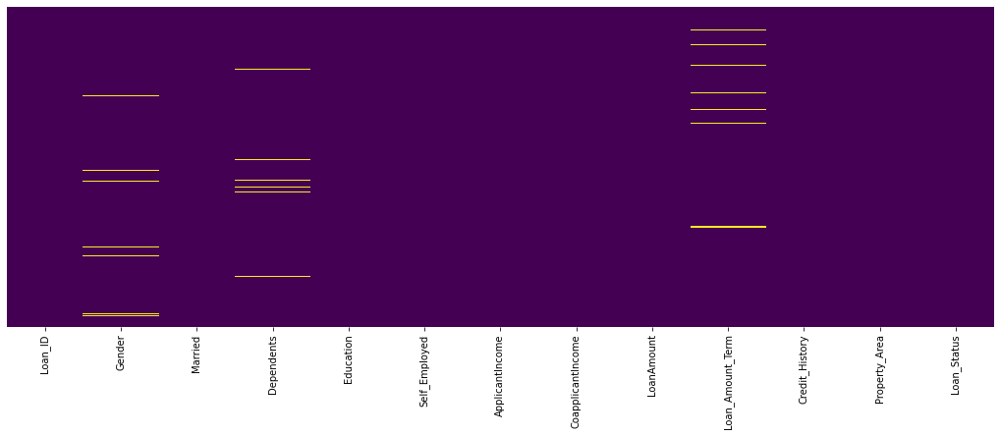

In [16]:
plt.figure(figsize=(18,6))
sns.heatmap(data = df_loan_train.isnull(), yticklabels=False, cbar=False, cmap='viridis')

In [17]:
#exploring what the data inside our loan 
df_loan_train['Loan_Amount_Term'].value_counts()

360.0    512
180.0     44
480.0     15
300.0     13
84.0       4
240.0      4
120.0      3
36.0       2
60.0       2
12.0       1
Name: Loan_Amount_Term, dtype: int64

In [18]:
#how many null values do we have?
df_loan_train['Loan_Amount_Term'].isna().value_counts()

False    600
True      14
Name: Loan_Amount_Term, dtype: int64

In [19]:
#same methodology as before, numerical data so we will fill with mean to maintain the same distributions while not losing valuable data in other categories
loan_amt_train_mean = df_loan_train['Loan_Amount_Term'].mean()
loan_amt_test_mean = df_loan_test['Loan_Amount_Term'].mean()

df_loan_train['Loan_Amount_Term'] = df_loan_train['Loan_Amount_Term'].fillna(loan_amt_train_mean)
df_loan_test['Loan_Amount_Term'] = df_loan_test['Loan_Amount_Term'].fillna(loan_amt_test_mean)


<AxesSubplot:>

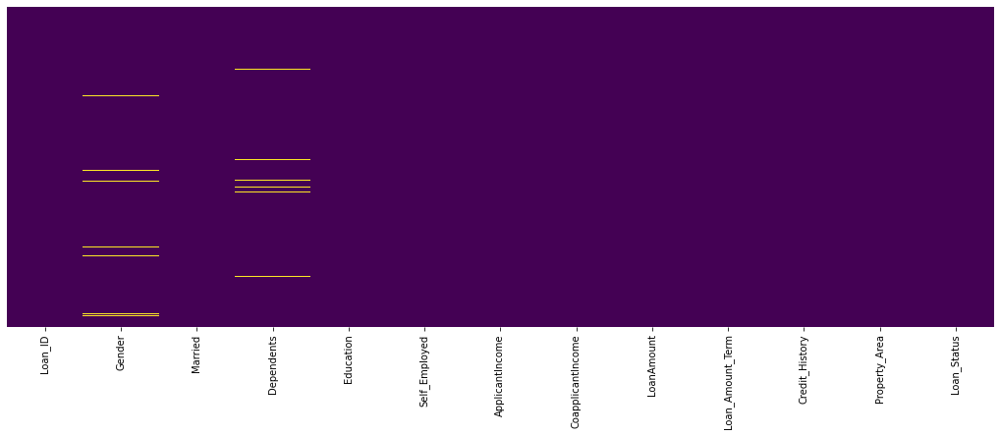

In [20]:
plt.figure(figsize=(18,6))
sns.heatmap(data = df_loan_train.isnull(), yticklabels=False, cbar=False, cmap='viridis')

In [21]:
#exploring dependents
print(df_loan_train['Dependents'].value_counts())
print('\n\n', df_loan_train['Dependents'].isna().value_counts())

0     345
1     102
2     101
3+     51
Name: Dependents, dtype: int64


 False    599
True      15
Name: Dependents, dtype: int64


In [22]:
# 15 NA values, lets go head and fill those to 0 as not having data on dependents is most likely to mean that they dont have any. 
df_loan_train['Dependents'] = df_loan_train['Dependents'].fillna(0)
df_loan_test['Dependents'] = df_loan_test['Dependents'].fillna(0)



<AxesSubplot:>

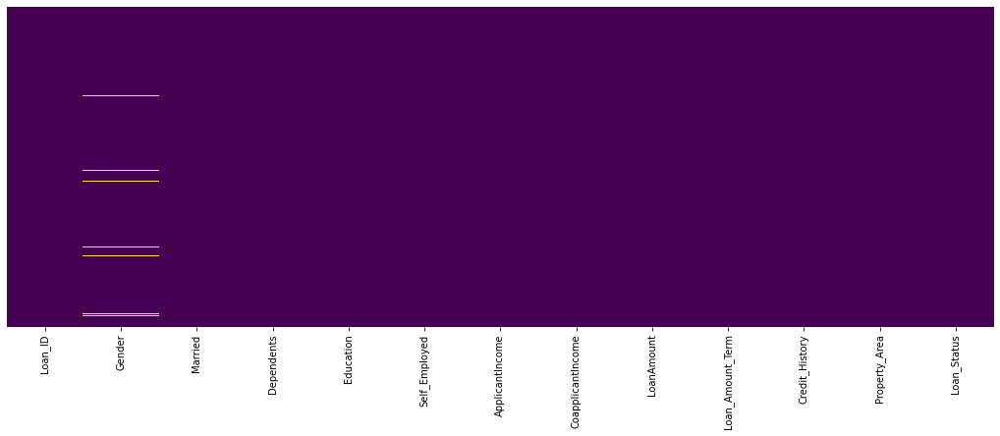

In [23]:
plt.figure(figsize=(18,6))
sns.heatmap(data = df_loan_train.isnull(), yticklabels=False, cbar=False, cmap='viridis')

In [24]:
#explore the values of gender
print(df_loan_train['Gender'].value_counts())
print('\n\n', df_loan_train['Gender'].isna().value_counts())

Male      489
Female    112
Name: Gender, dtype: int64


 False    601
True      13
Name: Gender, dtype: int64


In [25]:
#really curious about the NA values on gender, could mean that they are nonbinary. Wondering if theres some significant difference about the rest of the data in these rows

df_loan_train[df_loan_train['Gender'].isna()].head(13)

,Loan_ID,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area,Loan_Status
23,LP001050,NaN,Yes,2,Not Graduate,No,3365,1917.0,112.0,360.0,0.0,Rural,N
126,LP001448,NaN,Yes,3+,Graduate,No,23803,0.0,370.0,360.0,1.0,Rural,Y
171,LP001585,NaN,Yes,3+,Graduate,No,51763,0.0,700.0,300.0,1.0,Urban,Y
188,LP001644,NaN,Yes,0,Graduate,Yes,674,5296.0,168.0,360.0,1.0,Rural,Y
314,LP002024,NaN,Yes,0,Graduate,No,2473,1843.0,159.0,360.0,1.0,Rural,N
334,LP002103,NaN,Yes,1,Graduate,Yes,9833,1833.0,182.0,180.0,1.0,Urban,Y
460,LP002478,NaN,Yes,0,Graduate,Yes,2083,4083.0,160.0,360.0,0.0,Semiurban,Y
467,LP002501,NaN,Yes,0,Graduate,No,16692,0.0,110.0,360.0,1.0,Semiurban,Y
477,LP002530,NaN,Yes,2,Graduate,No,2873,1872.0,132.0,360.0,0.0,Semiurban,N
507,LP002625,NaN,No,0,Graduate,No,3583,0.0,96.0,360.0,1.0,Urban,N


In [26]:
#looks relatively similar to the rest of the dataset we have too few to do meaningful analysis on nonbinary as a gender, we'll impute them to the mode value

df_loan_train['Gender']=df_loan_train['Gender'].fillna('Male')
df_loan_test['Gender']=df_loan_test['Gender'].fillna('Male')

<AxesSubplot:>

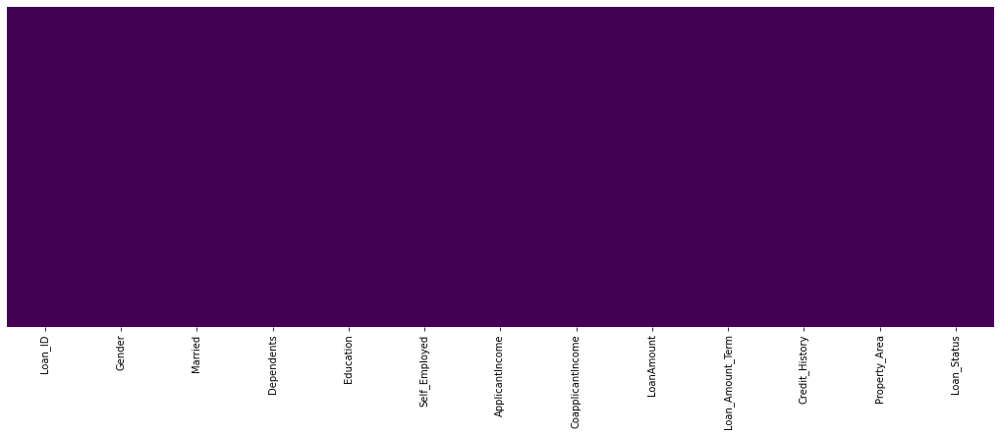

In [27]:
plt.figure(figsize=(18,6))
sns.heatmap(data = df_loan_train.isnull(), yticklabels=False, cbar=False, cmap='viridis')

In [28]:
#checking to see if there are any null values I missed, not shown well on heatmap

print(df_loan_train.isna().sum())
print('\n\n', df_loan_test.isna().sum())

Loan_ID              0
Gender               0
Married              3
Dependents           0
Education            0
Self_Employed        0
ApplicantIncome      0
CoapplicantIncome    0
LoanAmount           0
Loan_Amount_Term     0
Credit_History       0
Property_Area        0
Loan_Status          0
dtype: int64


 Loan_ID              0
Gender               0
Married              0
Dependents           0
Education            0
Self_Employed        0
ApplicantIncome      0
CoapplicantIncome    0
LoanAmount           0
Loan_Amount_Term     0
Credit_History       0
Property_Area        0
dtype: int64


In [29]:
# few married that were missed in the heatmap visualization

print(df_loan_train['Married'].value_counts())
print(df_loan_train['Married'].isna().value_counts())

Yes    398
No     213
Name: Married, dtype: int64
False    611
True       3
Name: Married, dtype: int64


In [30]:
#filling to mode
df_loan_train['Married'] = df_loan_train['Married'].fillna('Yes')

In [31]:
#now that we've dealt with all of our NA values, lets impute categorical data
df_loan_train.dtypes

Loan_ID               object
Gender                object
Married               object
Dependents            object
Education             object
Self_Employed         object
ApplicantIncome        int64
CoapplicantIncome    float64
LoanAmount           float64
Loan_Amount_Term     float64
Credit_History       float64
Property_Area         object
Loan_Status           object
dtype: object

In [32]:
#yes or no data, lets replace with 1 for yes, 0 for no
df_loan_train['Loan_Status'].value_counts()

Y    422
N    192
Name: Loan_Status, dtype: int64

In [33]:
#replacing values for train
dummies = pd.get_dummies(df_loan_train['Loan_Status'])
df_loan_train['Loan_Status'] = dummies['Y'].values
df_loan_train['Loan_Status'].value_counts()


1    422
0    192
Name: Loan_Status, dtype: int64

In [34]:
#next lets tackle Property_Area
dummies = pd.get_dummies(df_loan_train['Property_Area'])
df_loan_train = pd.concat([dummies[['Rural','Semiurban','Urban']],df_loan_train],axis=1)
dummies = pd.get_dummies(df_loan_test['Property_Area'])
df_loan_test = pd.concat([dummies[['Rural','Semiurban','Urban']],df_loan_test],axis=1)

In [35]:
df_loan_test.drop(columns=['Property_Area'],inplace=True)
df_loan_train.drop(columns=['Property_Area'],inplace=True)

In [36]:
#lets tackle gender
dummies = pd.get_dummies(df_loan_train['Gender'],drop_first=True)
df_loan_train['Gender'] = dummies['Male']

dummies = pd.get_dummies(df_loan_test['Gender'],drop_first=True)
df_loan_test['Gender'] = dummies['Male']

In [37]:
#converting dependents to their integer values
df_loan_train['Dependents']= df_loan_train['Dependents'].replace('3+',3)
df_loan_train['Dependents'] = df_loan_train['Dependents'].astype('int32')

In [38]:
df_loan_test['Dependents']= df_loan_test['Dependents'].replace('3+',3)
df_loan_test['Dependents'] = df_loan_test['Dependents'].astype('int32')

In [39]:
df_loan_train['Education']=pd.get_dummies(df_loan_train['Education'])['Graduate']

In [40]:
df_loan_test['Education']=pd.get_dummies(df_loan_test['Education'])['Graduate']

In [41]:
#encode married to 1 for married, 0 for not married
df_loan_train['Married']=pd.get_dummies(df_loan_train['Married'])['Yes']
df_loan_test['Married']=pd.get_dummies(df_loan_test['Married'])['Yes']

In [42]:
#encode self employed to 0 for not self employed, 1 for self employed
df_loan_train['Self_Employed']=pd.get_dummies(df_loan_train['Self_Employed'])['Yes']
df_loan_test['Self_Employed']=pd.get_dummies(df_loan_test['Self_Employed'])['Yes']

# Exploring our Cleaned Data


In [43]:
X_to_predict = df_loan_test
X = df_loan_train.iloc[:,:-1]
y = df_loan_train.iloc[:,-1:]
X.drop(columns=['Loan_ID'],inplace=True)
X_to_predict.drop(columns=['Loan_ID'],inplace=True)

<AxesSubplot:>

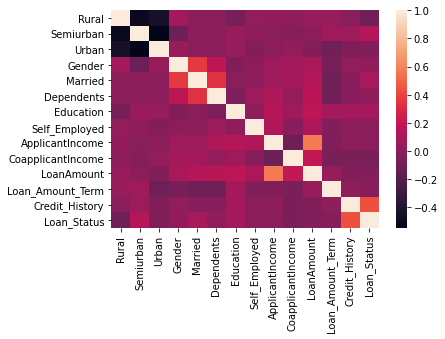

In [44]:
#checking correlations between different features, most features seem to be relatively independent of each other with mostly weak correlations
sns.heatmap(data=df_loan_train.corr())

<AxesSubplot:xlabel='LoanAmount', ylabel='Count'>

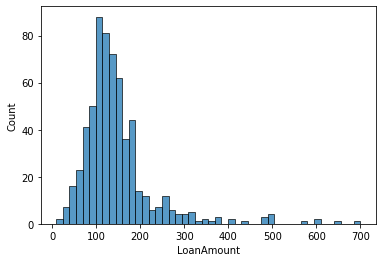

In [45]:
sns.histplot(data=df_loan_train, x='LoanAmount',palette='Set1')

<AxesSubplot:xlabel='Loan_Amount_Term', ylabel='Count'>

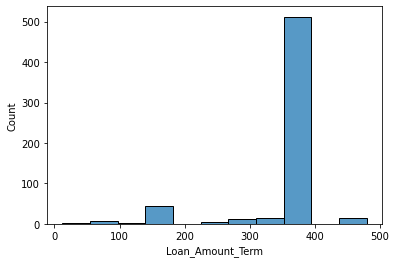

In [46]:
#loan distribution overwhelmingly at 360 months (30 years). Would assume that these are home loans and would be interested to see how home loans differ from other types of loans if we had proper categorical data
sns.histplot(data=df_loan_train, x='Loan_Amount_Term',palette='Set1')

In [47]:
df_loan_train.describe()

,Rural,Semiurban,Urban,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Loan_Status
count,614.000000,614.000000,614.000000,614.000000,614.000000,614.000000,614.000000,614.000000,614.000000,614.000000,614.000000,614.000000,614.000000,614.000000
mean,0.291531,0.379479,0.328990,0.817590,0.653094,0.744300,0.781759,0.133550,5403.459283,1621.245798,146.412162,342.000000,0.773616,0.687296
std,0.454838,0.485653,0.470229,0.386497,0.476373,1.009623,0.413389,0.340446,6109.041673,2926.248369,84.037468,64.372489,0.418832,0.463973
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,150.000000,0.000000,9.000000,12.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,2877.500000,0.000000,100.250000,360.000000,1.000000,0.000000
50%,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000,0.000000,3812.500000,1188.500000,129.000000,360.000000,1.000000,1.000000
75%,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,5795.000000,2297.250000,164.750000,360.000000,1.000000,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,3.000000,1.000000,1.000000,81000.000000,41667.000000,700.000000,480.000000,1.000000,1.000000


In [48]:
#split data for model training
from sklearn.model_selection import train_test_split
X_train, X_test, y_train,  y_test = train_test_split(X,y,test_size=.3,random_state=2)

In [49]:
#decision tree model
from sklearn.tree import DecisionTreeClassifier
dtree = DecisionTreeClassifier(criterion='entropy',random_state=42)

In [50]:
dtree.fit(X_train,y_train)

DecisionTreeClassifier(criterion='entropy', random_state=42)

In [51]:
from sklearn.metrics import classification_report,confusion_matrix
dtree_pred = dtree.predict(X_test)
print(classification_report(y_test,dtree_pred))
print(confusion_matrix(y_test,dtree_pred))

              precision    recall  f1-score   support

           0       0.48      0.53      0.51        58
           1       0.78      0.74      0.76       127

    accuracy                           0.68       185
   macro avg       0.63      0.64      0.63       185
weighted avg       0.69      0.68      0.68       185

[[31 27]
 [33 94]]


In [52]:
#our accuracy is reasonable but not ideal at .7
#lets build a visualization to examine our tree

import graphviz
import pydotplus
import mglearn
from sklearn.tree import export_graphviz

In [53]:
feature_names = [x for x in X_train.columns]
dot_data = export_graphviz(
    dtree,
    out_file=None,
    feature_names=feature_names,
    max_depth=5,
    class_names='Loan Approval',
    rounded=True,
    filled=True
)

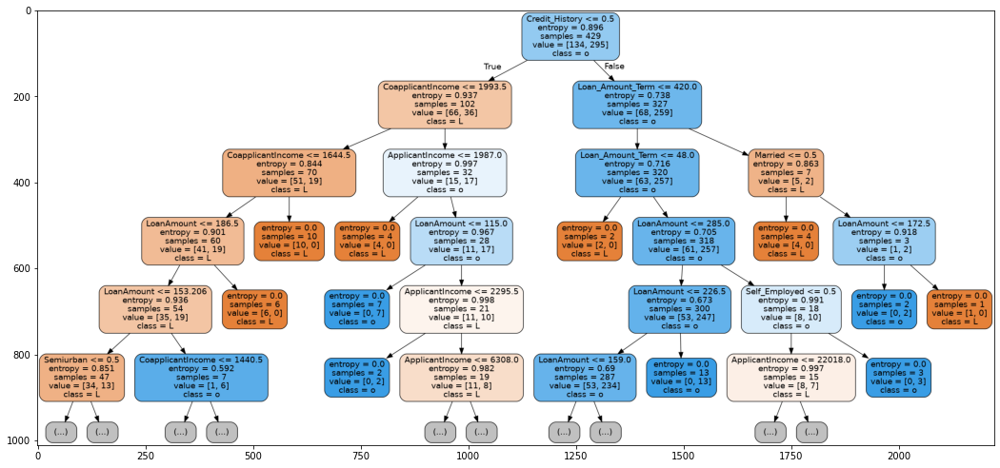

In [54]:
import matplotlib.image as mpimg
graph = pydotplus.graph_from_dot_data(dot_data)
plt.figure(figsize=(18,12))
graph.write_png('decision_tree.png')
graph = mpimg.imread('decision_tree.png')
plt.imshow(graph);



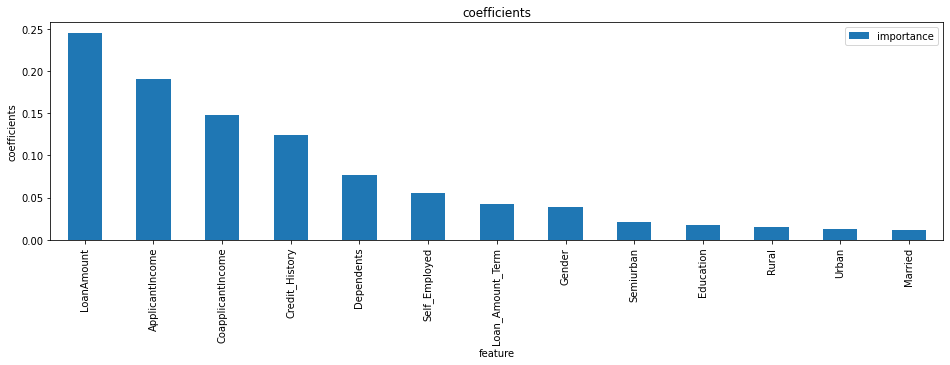

In [55]:
from useful_functions import junaid_fns
junaid_fns.feature_plot(dtree.feature_importances_,feature_names)

In [56]:
#looking at our feature importance, we can see that Applicant income and Loan Amount are our most important features
#lets see if we can improve our decision tree's accuracy with randomsearch

from sklearn.model_selection import RandomizedSearchCV




In [57]:
dtree_RS = DecisionTreeClassifier(random_state=1)
param_dist = {"max_depth": range(0,10),
              "max_features": range(0,11),
              "min_samples_leaf": range(1,9),
              "criterion": ["gini", "entropy"]}

dtree_random_cv = RandomizedSearchCV(dtree_RS, param_dist, cv=5,random_state=90)



In [58]:
dtree_random_cv.fit(X_train,y_train.iloc[:,0])

RandomizedSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=1),
                   param_distributions={'criterion': ['gini', 'entropy'],
                                        'max_depth': range(0, 10),
                                        'max_features': range(0, 11),
                                        'min_samples_leaf': range(1, 9)},
                   random_state=90)

In [59]:
#accuracy score up 5% from without random search15383none
junaid_fns.print_report(dtree_random_cv.cv_results_,3)

Model rank:  1
Mean validation score: 0.706
std_test_score: 0.028
Parameters: {'min_samples_leaf': 3, 'max_features': 5, 'max_depth': 2, 'criterion': 'entropy'}

Model rank:  2
Mean validation score: 0.699
std_test_score: 0.023
Parameters: {'min_samples_leaf': 4, 'max_features': 3, 'max_depth': 5, 'criterion': 'entropy'}

Model rank:  3
Mean validation score: 0.697
std_test_score: 0.073
Parameters: {'min_samples_leaf': 5, 'max_features': 1, 'max_depth': 5, 'criterion': 'gini'}



In [60]:
dtree_optimized = DecisionTreeClassifier(min_samples_leaf=5,max_features=1,max_depth=6,criterion='gini',random_state=4)

In [61]:
dtree_optimized.fit(X_train,y_train)

DecisionTreeClassifier(max_depth=6, max_features=1, min_samples_leaf=5,
                       random_state=4)

In [62]:
dtree_optimized_pred = dtree_optimized.predict(X_test)

In [63]:
print('New Values:')
print(classification_report(y_test,dtree_optimized_pred))
print(confusion_matrix(y_test,dtree_optimized_pred))

print('\n\n\nPrevious Values: ')
print(classification_report(y_test,dtree_pred))
print(confusion_matrix(y_test,dtree_pred))

New Values:
              precision    recall  f1-score   support

           0       0.50      0.31      0.38        58
           1       0.73      0.86      0.79       127

    accuracy                           0.69       185
   macro avg       0.62      0.58      0.59       185
weighted avg       0.66      0.69      0.66       185

[[ 18  40]
 [ 18 109]]



Previous Values: 
              precision    recall  f1-score   support

           0       0.48      0.53      0.51        58
           1       0.78      0.74      0.76       127

    accuracy                           0.68       185
   macro avg       0.63      0.64      0.63       185
weighted avg       0.69      0.68      0.68       185

[[31 27]
 [33 94]]


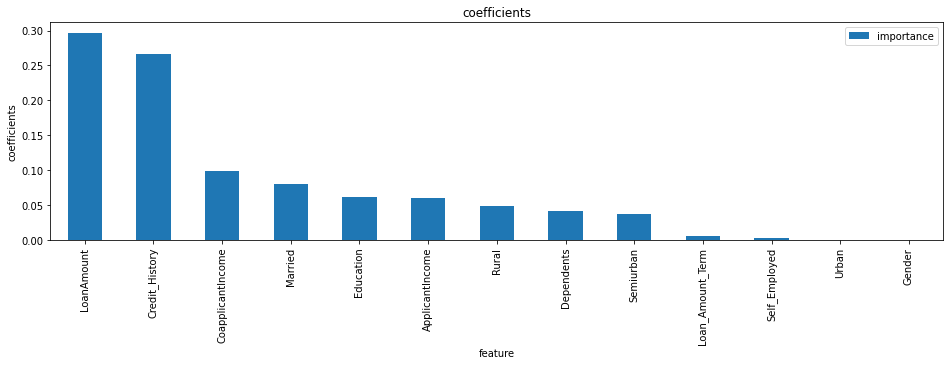

In [64]:
junaid_fns.feature_plot(dtree_optimized.feature_importances_,feature_names)

In [65]:
feature_names = [x for x in X_train.columns]
dot_data = export_graphviz(
    dtree_optimized,
    out_file=None,
    feature_names=feature_names,
    max_depth=5,
    class_names='Loan Approval',
    rounded=True,
    filled=True
)

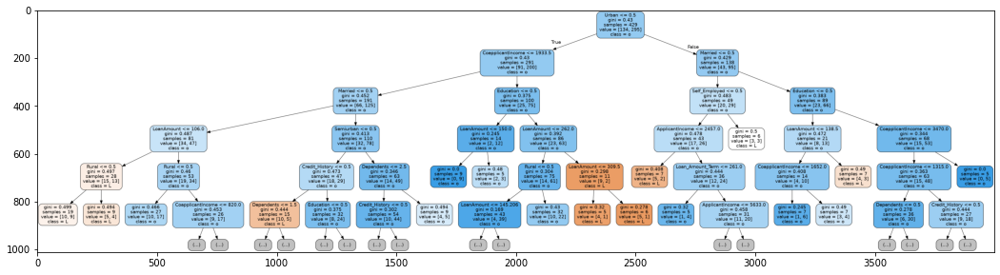

In [66]:
#visualization of optimized decision tree
import matplotlib.image as mpimg
graph = pydotplus.graph_from_dot_data(dot_data)
plt.figure(figsize=(18,12))
graph.write_png('dtree_optimized.png')
graph = mpimg.imread('dtree_optimized.png')
plt.imshow(graph);

we see a significant increase in accuracy and in the optimized model, lets try Random Forest to see if we can improve these results even further

# Random Forest


In [67]:
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(n_estimators=200,random_state=26)
#23 == 76

In [68]:
rfc.fit(X_train,y_train.iloc[:,0])

RandomForestClassifier(n_estimators=200, random_state=26)

In [69]:
rfc_pred = rfc.predict(X_test)

In [70]:
#metrics for all models
print('random forest:')
print(classification_report(y_test,rfc_pred))
print(confusion_matrix(y_test,rfc_pred))

print('optimized decision tree:')
print(classification_report(y_test,dtree_optimized_pred))
print(confusion_matrix(y_test,dtree_optimized_pred))
print('decision tree: ')
print(classification_report(y_test,dtree_pred))
print(confusion_matrix(y_test,dtree_pred))

random forest:
              precision    recall  f1-score   support

           0       0.67      0.38      0.48        58
           1       0.76      0.91      0.83       127

    accuracy                           0.75       185
   macro avg       0.71      0.65      0.66       185
weighted avg       0.73      0.75      0.72       185

[[ 22  36]
 [ 11 116]]
optimized decision tree:
              precision    recall  f1-score   support

           0       0.50      0.31      0.38        58
           1       0.73      0.86      0.79       127

    accuracy                           0.69       185
   macro avg       0.62      0.58      0.59       185
weighted avg       0.66      0.69      0.66       185

[[ 18  40]
 [ 18 109]]
decision tree: 
              precision    recall  f1-score   support

           0       0.48      0.53      0.51        58
           1       0.78      0.74      0.76       127

    accuracy                           0.68       185
   macro avg       0.63   

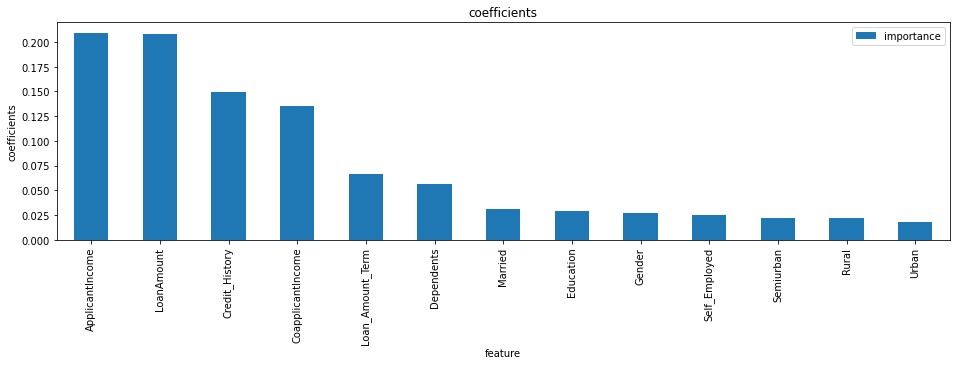

In [71]:
junaid_fns.feature_plot(rfc.feature_importances_,feature_names)

In [72]:
feature_names = [x for x in X_train.columns]
dot_data = export_graphviz(
    rfc.estimators_[0],
    out_file=None,
    feature_names=feature_names,
    
    class_names='Loan Approval',
    rounded=True,
    filled=True
)

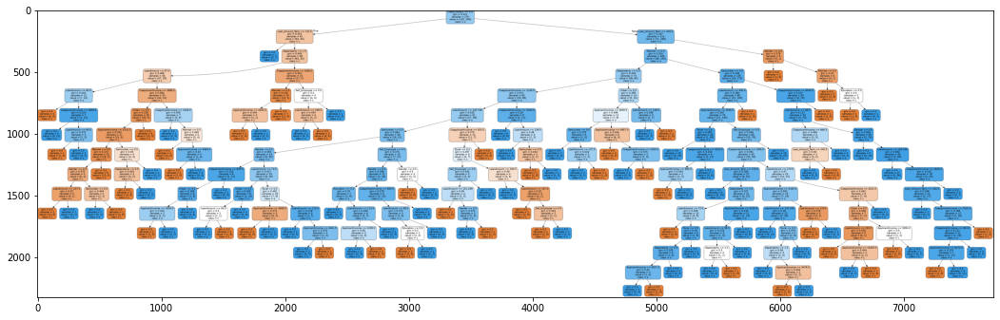

In [73]:
import matplotlib.image as mpimg
graph = pydotplus.graph_from_dot_data(dot_data)
plt.figure(figsize=(18,12))
graph.write_png('rfc_single_tree.png')
graph = mpimg.imread('rfc_single_tree.png')
plt.imshow(graph);

<AxesSubplot:>

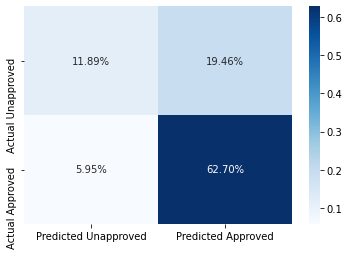

In [79]:
#confusion matrices for RFC
cf_matrix = confusion_matrix(y_test,rfc_pred)
ylabels = ['Actual Unapproved', 'Actual Approved']
xlabels = ['Predicted Unapproved', 'Predicted Approved']

sns.heatmap(cf_matrix/np.sum(cf_matrix), annot=True, xticklabels=xlabels, yticklabels=ylabels,
            fmt='.2%', cmap='Blues')

<AxesSubplot:>

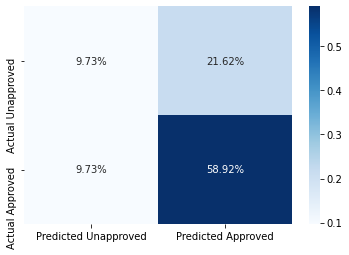

In [80]:
#confusion matrix for random searched decision tree
cf_matrix = confusion_matrix(y_test,dtree_optimized_pred)
ylabels = ['Actual Unapproved', 'Actual Approved']
xlabels = ['Predicted Unapproved', 'Predicted Approved']

sns.heatmap(cf_matrix/np.sum(cf_matrix), annot=True, xticklabels=xlabels, yticklabels=ylabels,
            fmt='.2%', cmap='Blues')

<AxesSubplot:>

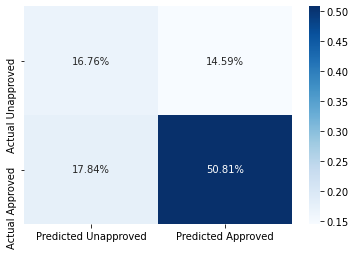

In [81]:
#confusion matrix for the original decision tree
cf_matrix = confusion_matrix(y_test,dtree_pred)
ylabels = ['Actual Unapproved', 'Actual Approved']
xlabels = ['Predicted Unapproved', 'Predicted Approved']

sns.heatmap(cf_matrix/np.sum(cf_matrix), annot=True, xticklabels=xlabels, yticklabels=ylabels,
            fmt='.2%', cmap='Blues')